In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

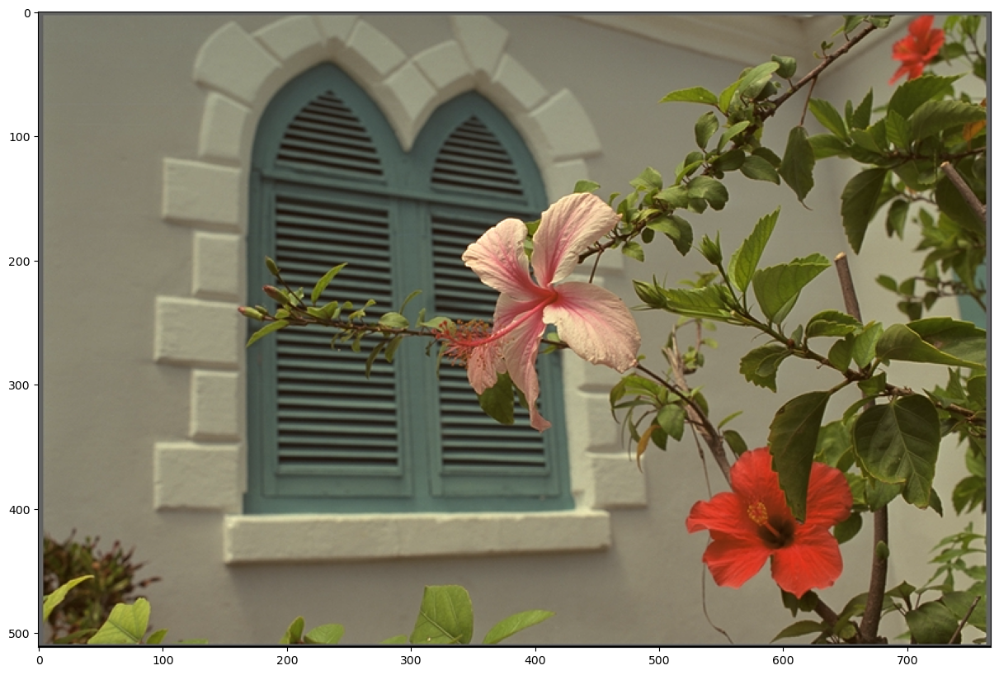

In [3]:
img = cv2.imread('./data/kodim07.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

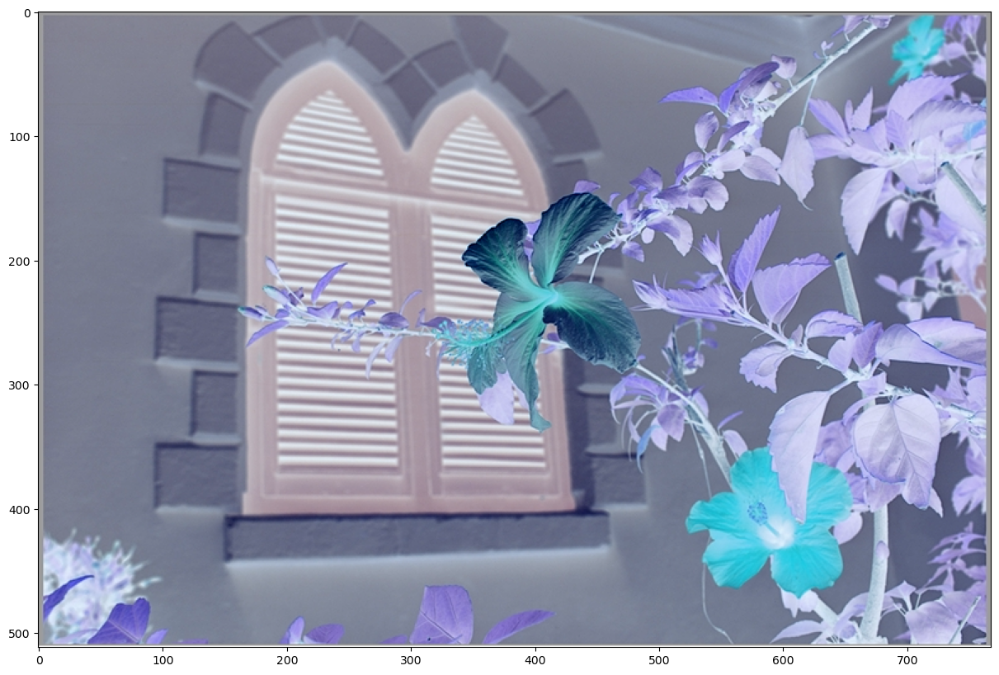

In [4]:
inverted_img = 255 - img.copy()
plt.imshow(inverted_img)

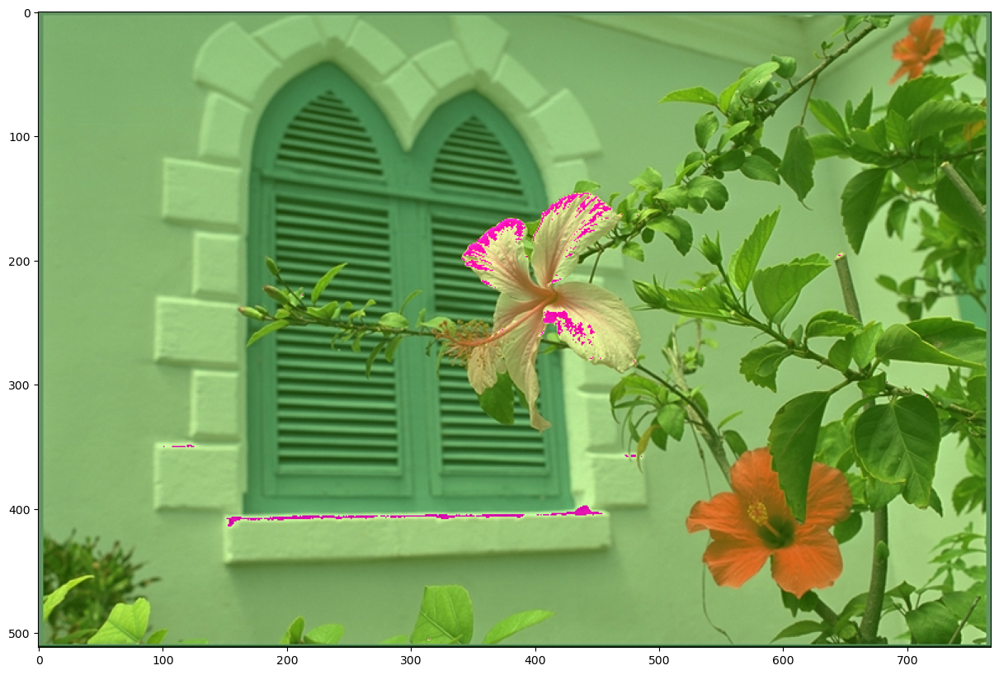

In [5]:
channel, constant_value = 1, 50
img_component_change = img.copy()
img_component_change[:, :, channel] = np.clip(img_component_change[:, :, channel] + constant_value, 0, 255)
plt.imshow(img_component_change)

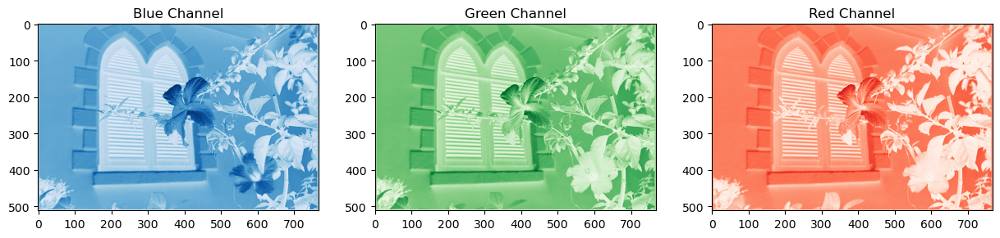

In [6]:
blue_channel = img[:, :, 0]
green_channel = img[:, :, 1]
red_channel = img[:, :, 2]

plt.subplot(131)
plt.imshow(blue_channel, cmap='Blues')
plt.title('Blue Channel')

plt.subplot(132)
plt.imshow(green_channel, cmap='Greens')
plt.title('Green Channel')

plt.subplot(133)
plt.imshow(red_channel, cmap='Reds')
plt.title('Red Channel')

plt.show()

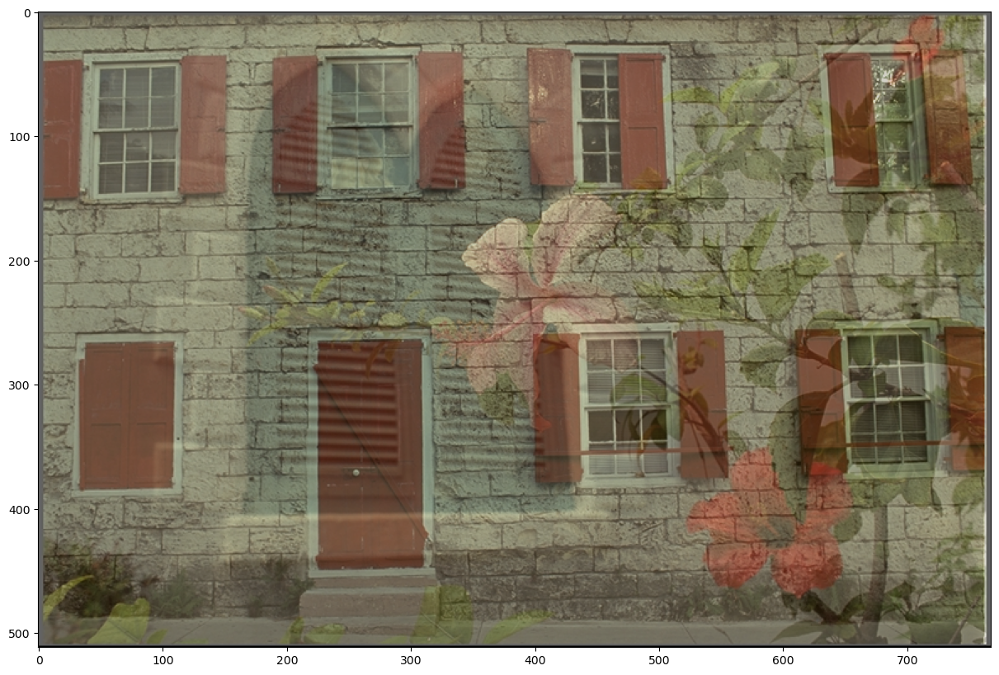

In [7]:
img_2 = cv2.imread('./data/kodim01.png')
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
alpha = 0.4
merged_image = np.clip(img * alpha + img_2 * (1 - alpha), 0, 255).astype(np.uint8)
plt.imshow(merged_image)

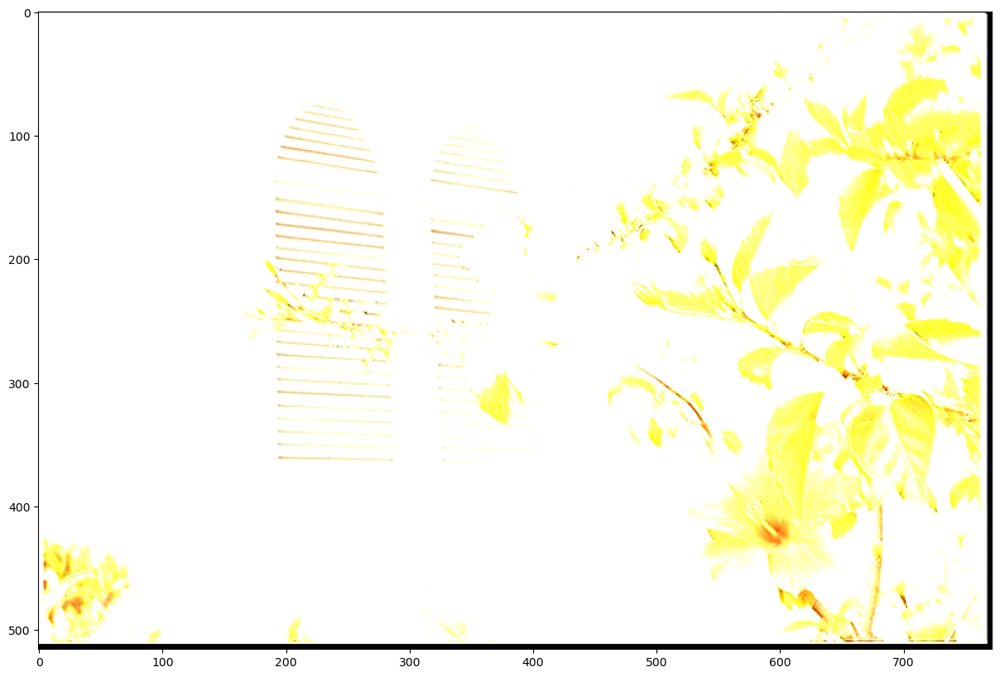

In [47]:
matrix_norm_dist = np.random.normal(0, 1, (5, 5))
img_norm = img.copy()

height, width, _ = img_norm.shape
padding = np.int32((matrix_norm_dist.shape[0] - 1) / 2)
expanded_image = np.pad(img_norm, ((padding,padding), (padding,padding),(0,0)), mode='constant', constant_values = (0,0)).astype(np.float32)

output_image = np.zeros_like(expanded_image).astype(np.float32)
for c in range(img_norm.shape[2]):
    for h in range(expanded_image.shape[0]-matrix_norm_dist.shape[0]+1):
        for w in range(expanded_image.shape[1]-matrix_norm_dist.shape[1]+1):
            roi = expanded_image[h:h + matrix_norm_dist.shape[0], w:w + matrix_norm_dist.shape[1], c]
            output_image[h, w, c] = np.sum(roi * matrix_norm_dist)
            output_image[h, w, c] = np.clip(output_image[h, w, c], 0, 255)
output_image = (output_image).astype(np.uint8)
plt.imshow(output_image)

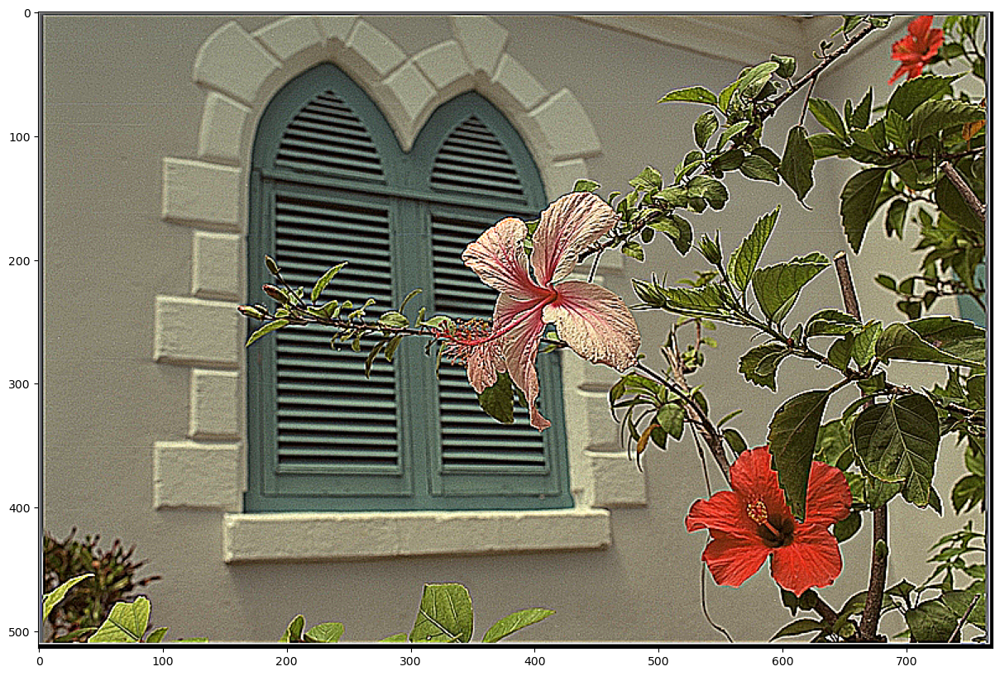

In [28]:
clar_enh_filter = np.array([[-1, -1, -1],
                           [-1, 9, -1],
                           [-1, -1, -1]])

height, width, _ = img.shape
padding = np.int32((clar_enh_filter.shape[0] - 1) / 2)
expanded_image = np.pad(img, ((padding,padding), (padding,padding),(0,0)), mode='constant', constant_values = (0,0)).astype(np.float32)

output_image = np.zeros_like(expanded_image).astype(np.float32)
for c in range(img.shape[2]):
    for h in range(expanded_image.shape[0]-clar_enh_filter.shape[0]+1):
        for w in range(expanded_image.shape[1]-clar_enh_filter.shape[1]+1):
            roi = expanded_image[h:h + clar_enh_filter.shape[0], w:w + clar_enh_filter.shape[1], c]
            output_image[h, w, c] = np.sum(roi * clar_enh_filter)
            output_image[h, w, c] = np.clip(output_image[h, w, c], 0, 255)
output_image = output_image.astype(np.uint8)
plt.imshow(output_image)

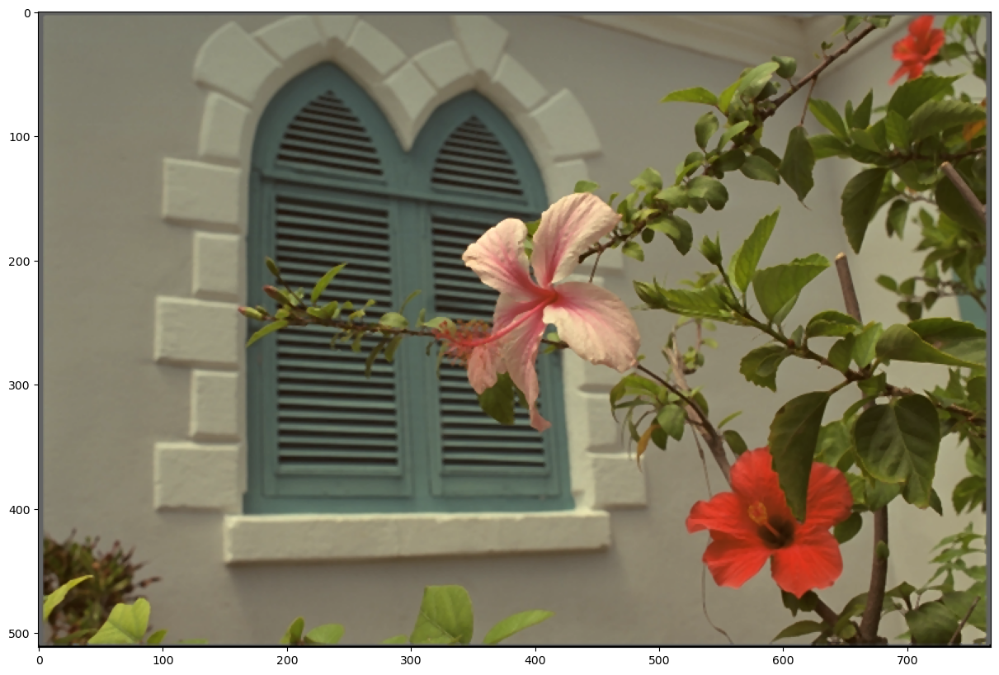

In [44]:
clar_enh_filter = np.zeros((3, 3))

height, width, _ = img.shape
padding = int((clar_enh_filter.shape[0] - 1) / 2)
expanded_image = np.zeros((height + 2 * padding, width + 2 * padding, 3), dtype=np.uint8)
expanded_image[padding:padding + height, padding:padding + width, :] = img

output_image = np.zeros_like(img)
for c in range(img.shape[2]):
    for h in range(expanded_image.shape[0]-clar_enh_filter.shape[0]+1):
        for w in range(expanded_image.shape[1]-clar_enh_filter.shape[1]+1):
            roi = expanded_image[h:h + clar_enh_filter.shape[0], w:w + clar_enh_filter.shape[1], c]
            output_image[h, w, c] = np.median(roi.reshape(1, -1)[0])
plt.imshow(output_image)

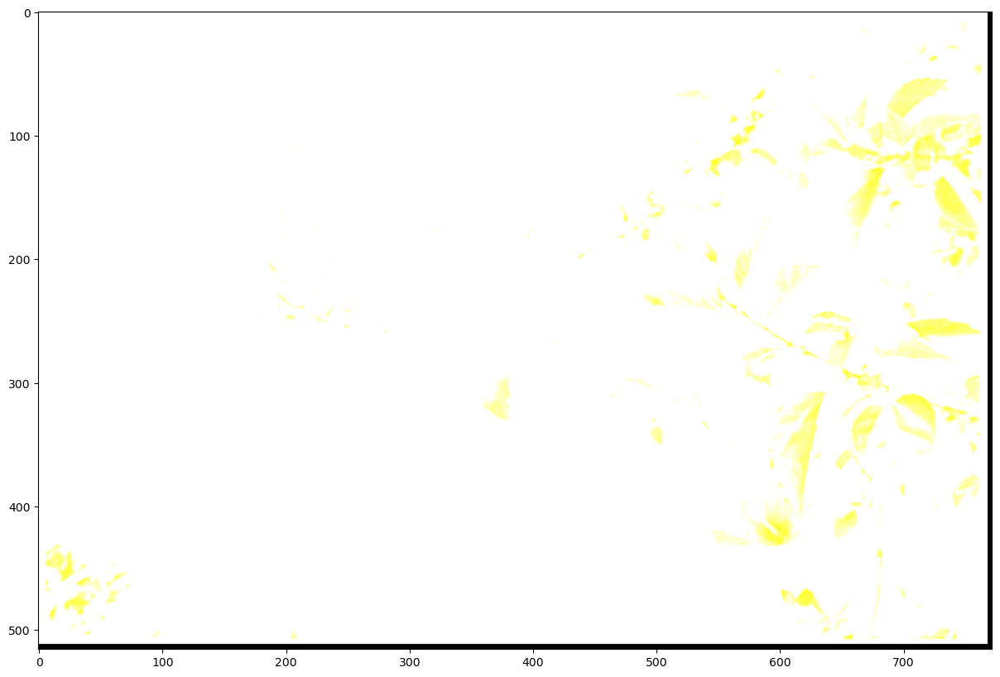

In [57]:
erosion_filter = np.array([[0, 0, 1, 0, 0],
                           [0, 1, 1, 1, 0],
                           [1, 1, 1, 1, 1],
                           [0, 1, 1, 1, 0],
                           [0, 0, 1, 0, 0],])

height, width, _ = img.shape
padding = np.int32((erosion_filter.shape[0] - 1) / 2)
expanded_image = np.pad(img, ((padding,padding), (padding,padding),(0,0)), mode='constant', constant_values = (0,0)).astype(np.float32)

output_image = np.zeros_like(expanded_image).astype(np.float32)
for c in range(img.shape[2]):
    for h in range(expanded_image.shape[0]-erosion_filter.shape[0]+1):
        for w in range(expanded_image.shape[1]-erosion_filter.shape[1]+1):
            roi = expanded_image[h:h + erosion_filter.shape[0], w:w + erosion_filter.shape[1], c]
            output_image[h, w, c] = np.sum(roi * erosion_filter)
            output_image[h, w, c] = np.clip(output_image[h, w, c], 0, 255)
output_image = output_image.astype(np.uint8)
plt.imshow(output_image)

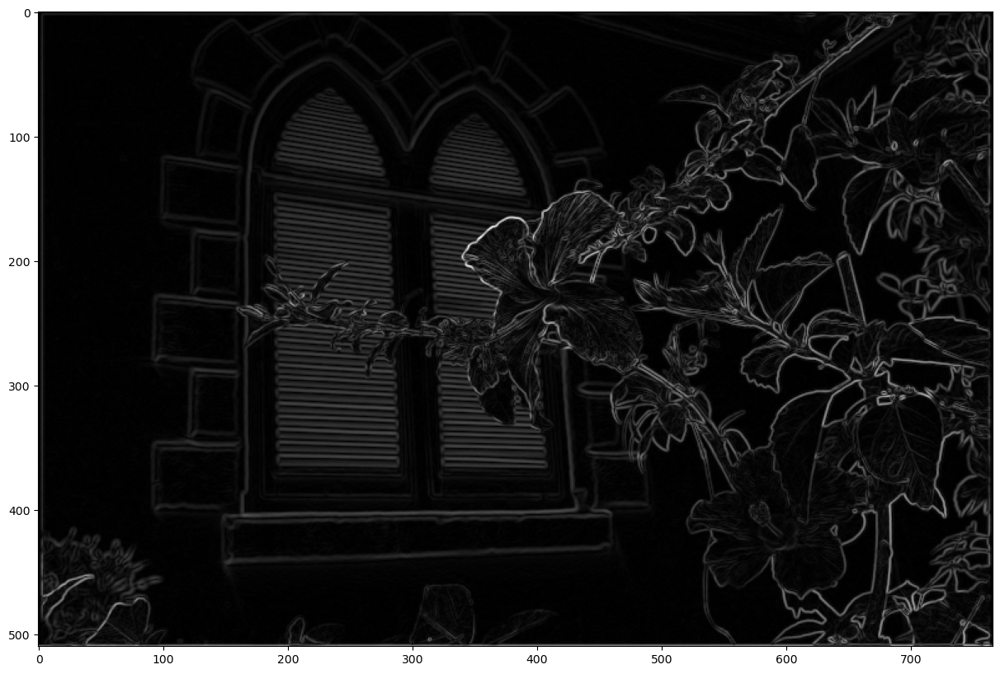

In [5]:
G_x = np.array([[-1, -2, -1],
                [0, 0, 0],
                [1, 2, 1]])
G_y = G_x.T.copy()
gray_scale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

output_image_x = np.zeros((gray_scale_img.shape[0] - G_x.shape[0] + 1, gray_scale_img.shape[1] - G_x.shape[1] + 1))
output_image_y = np.zeros((gray_scale_img.shape[0] - G_y.shape[0] + 1, gray_scale_img.shape[1] - G_y.shape[1] + 1))
for h in range(gray_scale_img.shape[0]-G_x.shape[0] + 1):
    for w in range(gray_scale_img.shape[1]-G_x.shape[1] + 1):
        roi = gray_scale_img[h:h + G_x.shape[0], w:w + G_x.shape[1]]
        output_image_x[h, w] = np.sum(roi * G_x)
        output_image_y[h, w] = np.sum(roi * G_y)

result = np.sqrt(output_image_x ** 2 + output_image_y ** 2)
plt.imshow(result, cmap='gray')